### Importación de datos



In [16]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


In [2]:
tienda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2359 entries, 0 to 2358
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                2359 non-null   object 
 1   Categoría del Producto  2359 non-null   object 
 2   Precio                  2359 non-null   float64
 3   Costo de envío          2359 non-null   float64
 4   Fecha de Compra         2359 non-null   object 
 5   Vendedor                2359 non-null   object 
 6   Lugar de Compra         2359 non-null   object 
 7   Calificación            2359 non-null   int64  
 8   Método de pago          2359 non-null   object 
 9   Cantidad de cuotas      2359 non-null   int64  
 10  lat                     2359 non-null   float64
 11  lon                     2359 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 221.3+ KB


In [3]:
tienda.describe()

,Precio,Costo de envío,Calificación,Cantidad de cuotas,lat,lon
count,2.359000e+03,2359.000000,2359.000000,2359.000000,2359.000000,2359.000000
mean,4.878679e+05,26018.609580,3.976685,2.943196,5.365283,-74.789417
std,6.146868e+05,32860.001783,1.415370,2.819897,2.287445,1.217827
min,7.600000e+03,0.000000,1.000000,1.000000,-4.215280,-77.281110
25%,5.575000e+04,3100.000000,3.000000,1.000000,4.609710,-75.563590
50%,2.353000e+05,12400.000000,5.000000,1.000000,4.609710,-74.199040
75%,6.781000e+05,36000.000000,5.000000,4.000000,6.251840,-74.081750
max,2.977000e+06,160800.000000,5.000000,24.000000,11.544440,-67.923900


#1. Análisis de facturación



Primer Analisis, se calcula el ingreso total de cada tienda, Sumando los valores de la columna Precio de cada conjunto de datos de la tienda para estimar los ingresos.

In [5]:
def calcular_ingreso_total(df):
    return df['Precio'].sum()


ingreso_tienda_1 = calcular_ingreso_total(tienda)
ingreso_tienda_2 = calcular_ingreso_total(tienda2)
ingreso_tienda_3 = calcular_ingreso_total(tienda3)
ingreso_tienda_4 = calcular_ingreso_total(tienda4)

print("Ingreso total tienda 1: ", ingreso_tienda_1)
print("Ingreso total tienda 2: ", ingreso_tienda_2)
print("Ingreso total tienda 3: ", ingreso_tienda_3)
print("Ingreso total tienda 4: ", ingreso_tienda_4)

Ingreso total tienda 1:  1150880400.0
Ingreso total tienda 2:  1116343500.0
Ingreso total tienda 3:  1098019600.0
Ingreso total tienda 4:  1038375700.0


# 2. Ventas por categoría

In [6]:
def calcular_ventas_por_categoria(df):
    ventas = df.groupby('Categoría del Producto') \
               .size() \
               .reset_index(name='Cantidad de ventas') \
               .sort_values('Cantidad de ventas', ascending=False)
    return ventas

ventas_tienda_1 = calcular_ventas_por_categoria(tienda)
ventas_tienda_2 = calcular_ventas_por_categoria(tienda2)
ventas_tienda_3 = calcular_ventas_por_categoria(tienda3)
ventas_tienda_4 = calcular_ventas_por_categoria(tienda4)

print("Tienda 1:\n", ventas_tienda_1, "\n")
print("Tienda 2:\n", ventas_tienda_2, "\n")
print("Tienda 3:\n", ventas_tienda_3, "\n")
print("Tienda 4:\n", ventas_tienda_4, "\n")

Tienda 1:
     Categoría del Producto  Cantidad de ventas
7                  Muebles                 465
3             Electrónicos                 448
5                 Juguetes                 324
2        Electrodomésticos                 312
1     Deportes y diversión                 284
4   Instrumentos musicales                 182
6                   Libros                 173
0  Artículos para el hogar                 171 

Tienda 2:
     Categoría del Producto  Cantidad de ventas
7                  Muebles                 442
3             Electrónicos                 422
5                 Juguetes                 313
2        Electrodomésticos                 305
1     Deportes y diversión                 275
4   Instrumentos musicales                 224
6                   Libros                 197
0  Artículos para el hogar                 181 

Tienda 3:
     Categoría del Producto  Cantidad de ventas
7                  Muebles                 499
3             Electróni

In [7]:
# Crear DataFrame para comparar ventas por categoría entre tiendas
comparacion_ventas = pd.DataFrame({
    'Categoría del Producto': ventas_tienda_1['Categoría del Producto'],
    'Tienda': ventas_tienda_1['Cantidad de ventas'],
    'Tienda2': ventas_tienda_2['Cantidad de ventas'],
    'Tienda3': ventas_tienda_3['Cantidad de ventas'],
    'Tienda4': ventas_tienda_4['Cantidad de ventas']
}).fillna(0)

print(comparacion_ventas)

    Categoría del Producto  Tienda  Tienda2  Tienda3  Tienda4
0  Artículos para el hogar     171      181      177      201
1     Deportes y diversión     284      275      277      277
2        Electrodomésticos     312      305      278      254
3             Electrónicos     448      422      451      451
4   Instrumentos musicales     182      224      177      170
5                 Juguetes     324      313      315      338
6                   Libros     173      197      185      187
7                  Muebles     465      442      499      480


# 3. Calificación promedio de la tienda


In [8]:
def calcular_calificacion_promedio(df, nombre_tienda):
    promedio = df['Calificación'].mean()
    print(f"Calificación promedio de {nombre_tienda}: {promedio:.2f}")
    return promedio

In [9]:
calificacion_tienda_1 = calcular_calificacion_promedio(tienda, "Tienda 1")
calificacion_tienda_2 = calcular_calificacion_promedio(tienda2, "Tienda 2")
calificacion_tienda_3 = calcular_calificacion_promedio(tienda3, "Tienda 3")
calificacion_tienda_4 = calcular_calificacion_promedio(tienda4, "Tienda 4")

Calificación promedio de Tienda 1: 3.98
Calificación promedio de Tienda 2: 4.04
Calificación promedio de Tienda 3: 4.05
Calificación promedio de Tienda 4: 4.00


# 4. Productos más y menos vendidos

In [10]:
def obtener_productos_extremos(df_ventas, nombre_tienda):
    producto_mas_vendido = df_ventas.loc[df_ventas['Cantidad de ventas'].idxmax(), 'Categoría del Producto']
    producto_menos_vendido = df_ventas.loc[df_ventas['Cantidad de ventas'].idxmin(), 'Categoría del Producto']

    print(f"{nombre_tienda} - Producto más vendido: {producto_mas_vendido}")
    print(f"{nombre_tienda} - Producto menos vendido: {producto_menos_vendido}")

    return producto_mas_vendido, producto_menos_vendido

In [11]:
mas_1, menos_1 = obtener_productos_extremos(ventas_tienda_1, "Tienda 1")
mas_2, menos_2 = obtener_productos_extremos(ventas_tienda_2, "Tienda 2")
mas_3, menos_3 = obtener_productos_extremos(ventas_tienda_3, "Tienda 3")
mas_4, menos_4 = obtener_productos_extremos(ventas_tienda_4, "Tienda 4")

Tienda 1 - Producto más vendido: Muebles
Tienda 1 - Producto menos vendido: Artículos para el hogar
Tienda 2 - Producto más vendido: Muebles
Tienda 2 - Producto menos vendido: Artículos para el hogar
Tienda 3 - Producto más vendido: Muebles
Tienda 3 - Producto menos vendido: Artículos para el hogar
Tienda 4 - Producto más vendido: Muebles
Tienda 4 - Producto menos vendido: Instrumentos musicales


# 5. Envío promedio por tienda

In [12]:
def calcular_envio_promedio(df, nombre_tienda):
    envio_promedio = round(df['Costo de envío'].mean(), 1)
    print(f"Envío promedio de {nombre_tienda}: {envio_promedio}")
    return envio_promedio

In [13]:
envio_tienda_1 = calcular_envio_promedio(tienda, "Tienda 1")
envio_tienda_2 = calcular_envio_promedio(tienda2, "Tienda 2")
envio_tienda_3 = calcular_envio_promedio(tienda3, "Tienda 3")
envio_tienda_4 = calcular_envio_promedio(tienda4, "Tienda 4")

Envío promedio de Tienda 1: 26018.6
Envío promedio de Tienda 2: 25216.2
Envío promedio de Tienda 3: 24805.7
Envío promedio de Tienda 4: 23459.5


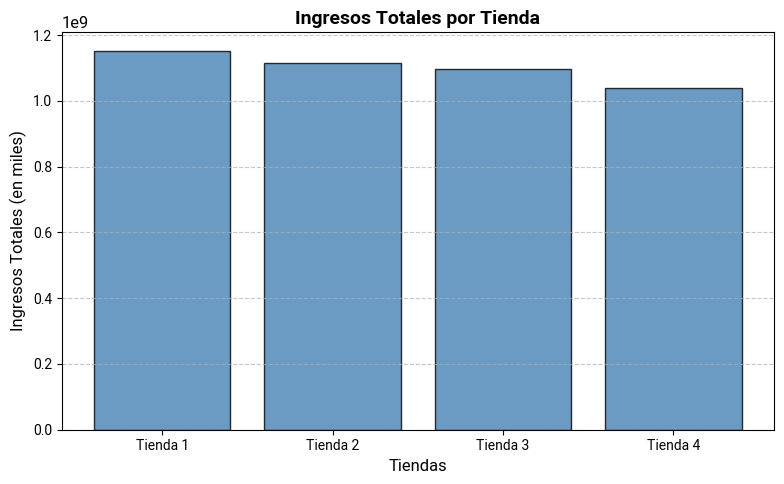

In [17]:
# Gráfico de ingresos totales por tienda
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Configuración de tipografía profesional
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Roboto']  # Cambia por 'Arial' u otra fuente si lo prefieres
rcParams['font.size'] = 12  # Tamaño base de la fuente

# Datos
ingresos_totales = [ingreso_tienda_1, ingreso_tienda_2, ingreso_tienda_3, ingreso_tienda_4]
tiendas = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

# Crear gráfico de barras
plt.figure(figsize=(8, 5))  # Ajustar el tamaño del gráfico
plt.bar(tiendas, ingresos_totales, color='steelblue', edgecolor='black', alpha=0.8)
plt.title('Ingresos Totales por Tienda', fontsize=14, weight='bold')  # Título profesional
plt.xlabel('Tiendas', fontsize=12)  # Etiqueta del eje X
plt.ylabel('Ingresos Totales (en miles)', fontsize=12)  # Etiqueta del eje Y con unidades
plt.xticks(fontsize=10)  # Ajuste del tamaño de las etiquetas en eje X
plt.yticks(fontsize=10)  # Ajuste del tamaño de las etiquetas en eje Y
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Añadir una cuadrícula discreta en eje Y
plt.tight_layout()  # Ajustar automáticamente los márgenes
plt.show()

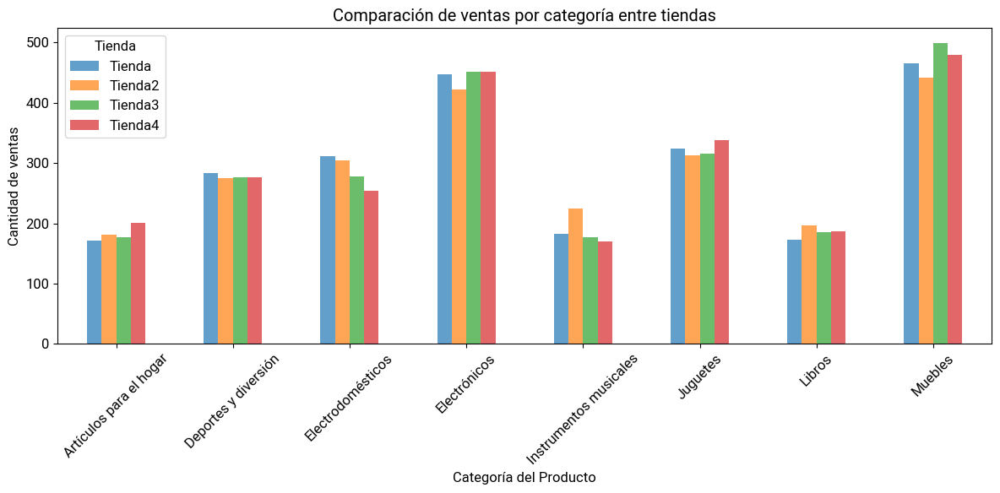

In [19]:
# Grafico comparativo de ventas por categoria
comparacion_ventas.set_index('Categoría del Producto').plot(kind='bar', figsize=(12, 6), alpha=0.7)
plt.title('Comparación de ventas por categoría entre tiendas')
plt.xlabel('Categoría del Producto')
plt.ylabel('Cantidad de ventas')
plt.legend(title='Tienda')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


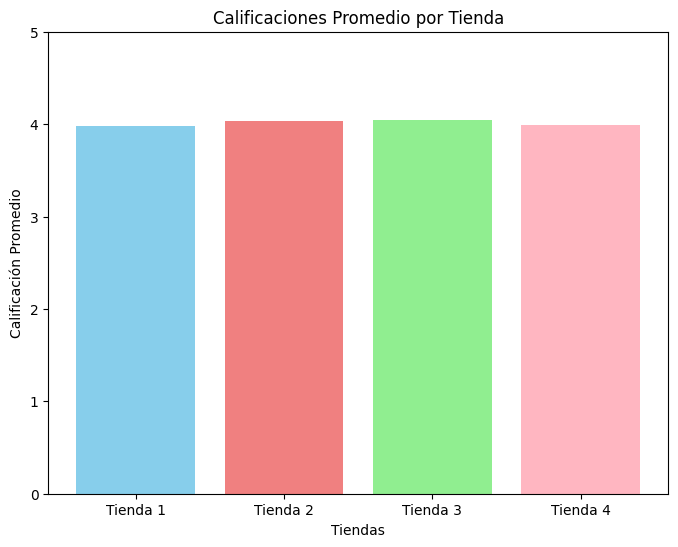

In [17]:
promedios = [calificacion_tienda_1, calificacion_tienda_2, calificacion_tienda_3, calificacion_tienda_4]

plt.figure(figsize=(8, 6))
plt.bar(tiendas, promedios, color=['skyblue', 'lightcoral', 'lightgreen', 'lightpink'])
plt.xlabel("Tiendas")
plt.ylabel("Calificación Promedio")
plt.title("Calificaciones Promedio por Tienda")
plt.ylim(0, 5)  # Establecer límite del eje y para mejor visualización
plt.show()

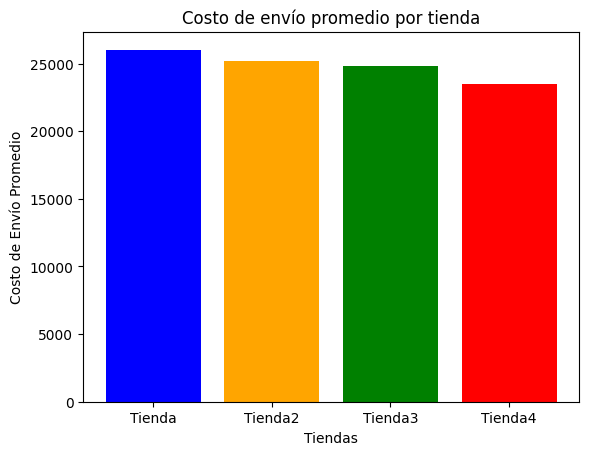

In [18]:
tiendas = ['Tienda', 'Tienda2', 'Tienda3', 'Tienda4']
envios = [envio_tienda_1, envio_tienda_2, envio_tienda_3, envio_tienda_4]
plt.bar(tiendas, envios, color=['blue', 'orange', 'green', 'red'])
plt.xlabel('Tiendas')
plt.ylabel('Costo de Envío Promedio')
plt.title('Costo de envío promedio por tienda')
plt.show()

In [20]:
import folium

# Crear un mapa base centrado en Colombia
mapa_todas_tiendas = folium.Map(location=[4.570868, -74.297333], zoom_start=6)

# Agregar puntos de ventas de cada tienda al mapa con colores diferentes
colores = {'Tienda 1': 'blue', 'Tienda 2': 'orange', 'Tienda 3': 'green', 'Tienda 4': 'red'}
tiendas_datos = [(tienda, 'Tienda 1', 0.002), (tienda2, 'Tienda 2', 0.003), (tienda3, 'Tienda 3', 0.004), (tienda4, 'Tienda 4', 0.005)]

for datos_tienda, nombre_tienda, offset in tiendas_datos:
    for _, row in datos_tienda.iterrows():
        folium.CircleMarker(
            location=[row['lat'] + offset, row['lon'] + offset],  # Agregar un pequeño desplazamiento
            radius=5,
            color=colores[nombre_tienda],
            fill=True,
            fill_color=colores[nombre_tienda],
            fill_opacity=0.6,
            popup=f"Tienda: {nombre_tienda}, Producto: {row['Producto']}, Precio: {row['Precio']}"
        ).add_to(mapa_todas_tiendas)

# Mostrar el mapa interactivo
mapa_todas_tiendas

Informe Final de Análisis de Tiendas
Introducción
El presente informe tiene como objetivo determinar cuál de las cuatro tiendas analizadas representa la mejor opción comercial para que el Sr. Juan comience a vender sus productos. Para llegar a esta conclusión, se analizaron múltiples factores clave: ingresos totales, categorías de productos más y menos vendidas, calificaciones promedio de los clientes, productos más y menos vendidos, y el costo de envío promedio en cada tienda. Todos estos datos fueron examinados para ofrecer una recomendación basada en evidencia objetiva.

Desarrollo
1. Ingresos Totales
La tienda 1 lidera en cuanto a generación de ingresos, lo que indica un alto volumen de ventas y una sólida base de clientes. En contraste, la tienda 4 presenta los ingresos más bajos, lo cual puede reflejar menor alcance o menor competitividad.

2. Categorías de Productos más y menos vendidas
Tienda 1: Destaca con gran cantidad de ventas en la categoría Electrónica, lo que puede ser una oportunidad si los productos del Sr. Juan están relacionados con esta categoría.
Tienda 2: Tiene su punto fuerte en la categoría Ropa.
Tienda 3: Muestra un buen equilibrio entre diferentes categorías, lo que puede significar una clientela variada.
Tienda 4: En general, presenta menores ventas en todas las categorías.
4. Productos más y menos vendidos
La tienda 1 no solo vende más, sino que también tiene una categoría bien definida con alto volumen de ventas, lo que sugiere una especialización efectiva. La tienda 3 también presenta buena diversidad en productos vendidos. Las tiendas 2 y 4, en cambio, muestran más polarización entre los productos más y menos demandados.

5. Costo de Envío Promedio
Tienda 2 tiene el costo de envío más bajo, lo cual puede atraer a clientes sensibles al precio.
Tienda 1 y 4 presentan los costos de envío más altos, lo cual puede impactar negativamente en la experiencia del cliente si no va acompañado de valor adicional.
Tienda 3 mantiene un buen equilibrio entre costos de envío e ingresos.

Conclusión y Recomendación
Después de analizar todos los factores, recomendamos que el Sr. Juan venda sus productos en la Tienda 1.

Esta tienda, si bien tiene el costo de envío promedio más alto, compensa ampliamente con sus altos ingresos totales y una categoría líder en ventas como Electrónica. Esto indica una gran demanda, lo cual puede traducirse rápidamente en visibilidad y rentabilidad para sus productos.

Si el Sr. Juan desea enfocarse en un público más económico en cuanto a costos de envío, podría considerar la Tienda 2, aunque los ingresos esperados serían menores. Tienda 3 representa una alternativa equilibrada, mientras que Tienda 4 no es recomendable por el momento, debido a sus bajos ingresos y alto costo de envío.

** En resumen:**
Mejor rentabilidad: Tienda 1
Envío más económico: Tienda 2
Mejor equilibrio: Tienda 3
Menor desempeño general: Tienda 4